# Project 2 Write-up - Pick and Place project

## Introduction

The aim of the project is to pick up on object from a shelf, and place this object into a bin, using a robotic arm. This project involved the composition and analysis of Forward Kinematics (FK) and Inverse Kinematic (IK) functions for the Kuka KR210 robotic arm. This write-up documents the following items:
* Annoted figure of link assignments and joint rotations
* DH parameter table
* Annotated figure for theta1, theta2 and theta3 determinations
* Extracted code and results for FK and IK debugging
* Images for project implementation
* **IK_server.py included in repository**

## 1. Kuka KR210

What does this robot look like? This is the Kuka KR210, courtesy of RobotWorx, https://media.robots.com/images/1363894998_1.jpg

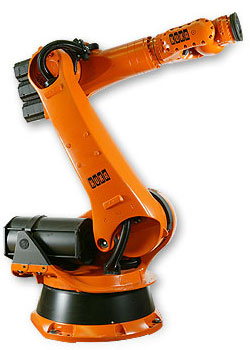

In [1]:
from IPython.display import Image
Image(filename="imgs/kukakr210.jpg", width=320, height=480)

## 2. Link assigment and joint rotation figure

The figure below shows the link assignments and joint rotations. For reference, the parameters are assigned as follows:

* twist angle = $\alpha_{i-1} = z_{i-1}$ to $z_i$, about $x_{i-1}$
* link length = $a_{i-1} = z_{i-1}$ to $z_i$, about $x_{i-1}$
* link offset = $d_i = x_{i-1}$ to $x_i$, about $z_i$
* joint angle = $\theta_i = x(i-1)$ to $x_i$, about $z_i$

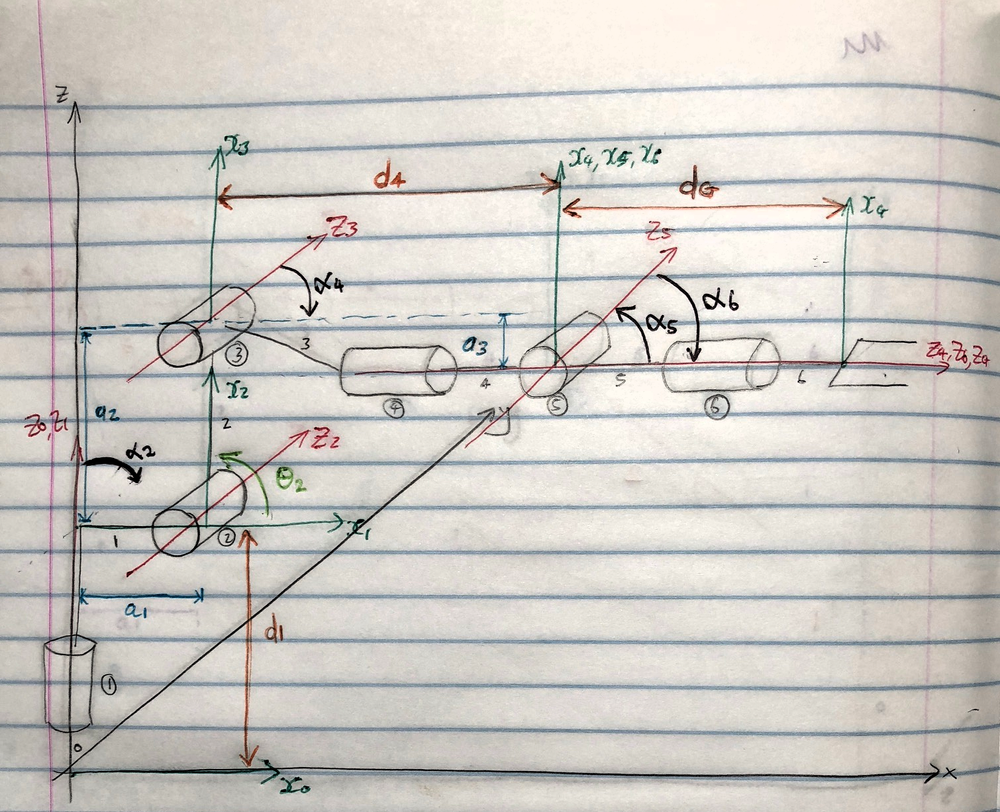

In [2]:
Image(filename="imgs/image1.png", width=768, height=480)

## 3. DH parameter table

Based on the figure and the associated URDF file, the DH parameter table is as follows:

| Links | alpha(i-1) |   a(i-1)   |    d(i)    |  theta(i)  |
|-------|------------|------------|------------|------------|
| 0 -> 1 |     0      |     0      |     0.75   |     0      |
| 1 -> 2 |  -pi/2     |   0.35     |     0      |  theta(i)-pi/2|
| 2 -> 3 |     0      |   1.25     |     0      |     0      |
| 3 -> 4 |  -pi/2     |  -0.054    |     1.50   |     0      |
| 4 -> 5 |   pi/2     |     0      |     0      |     0      |
| 5 -> 6 |  -pi/2     |     0      |     0      |     0      |
|6 -> EE|     0      |     0      |     0.303  |     0      |


## 4. Annoted figure for theta calculations

The figure below shows the angle assignments and relevent calculations. The cosine rule for known sides can be applied to calculate each angle.

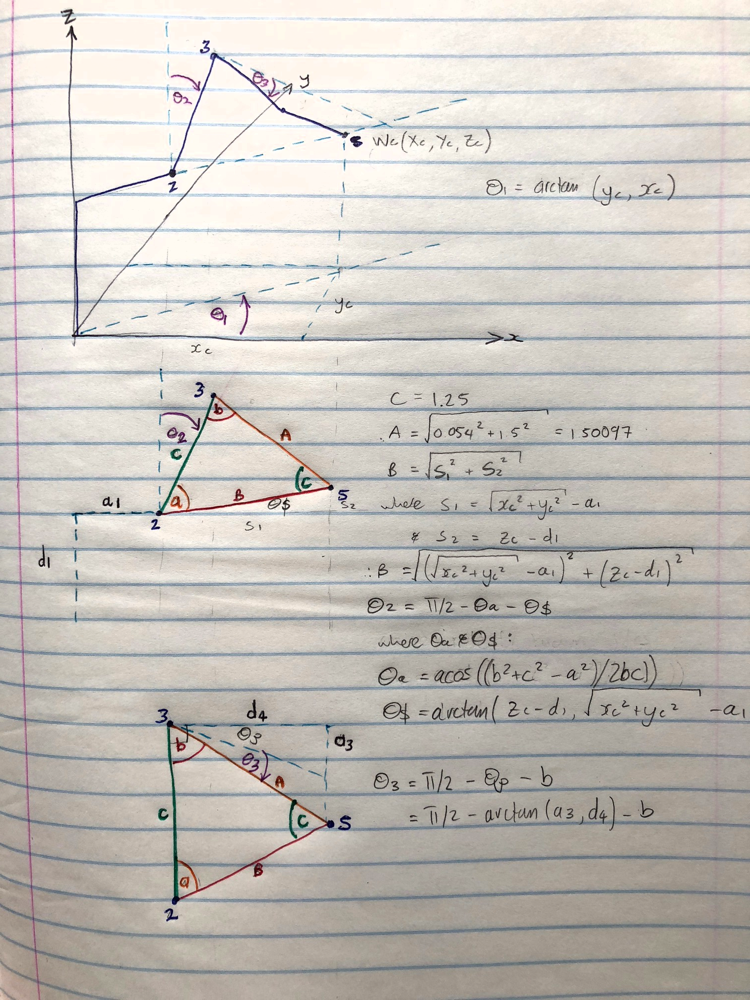

In [3]:
Image(filename="imgs/image2.png", width=768, height=480)

## 5. IK_debug.py test cases

### 5.1 Base code

The base code was obtained from the IK_debug.py file in the project repository. FK and IK functionality was implemented and the errors associated with the final End Effector (EE) position are demonstrated.

In [4]:
from sympy import *
from time import time
from mpmath import radians
import tf

'''
Format of test case is [ [[EE position],[EE orientation as quaternions]],[WC location],[joint angles]]
You can generate additional test cases by setting up your kuka project and running `$ roslaunch kuka_arm forward_kinematics.launch`
From here you can adjust the joint angles to find thetas, use the gripper to extract positions and orientation (in quaternion xyzw) and lastly use link 5
to find the position of the wrist center. These newly generated test cases can be added to the test_cases dictionary.
'''

test_cases = {1:[[[2.16135,-1.42635,1.55109],
                  [0.708611,0.186356,-0.157931,0.661967]],
                  [1.89451,-1.44302,1.69366],
                  [-0.65,0.45,-0.36,0.95,0.79,0.49]],
              2:[[[-0.56754,0.93663,3.0038],
                  [0.62073, 0.48318,0.38759,0.480629]],
                  [-0.638,0.64198,2.9988],
                  [-0.79,-0.11,-2.33,1.94,1.14,-3.68]],
              3:[[[-1.3863,0.02074,0.90986],
                  [0.01735,-0.2179,0.9025,0.371016]],
                  [-1.1669,-0.17989,0.85137],
                  [-2.99,-0.12,0.94,4.06,1.29,-4.12]],
              4:[],
              5:[]}



### 5.2 Additional
Additional functions were added. Note the setup of the generic homogenous transform matrix.

In [5]:
# Define function to compose the generic Transform matrix
def T_Matrix(alpha, a, d, q):
    T = Matrix([[cos(q)             , -sin(q)               , 0             , a],
                [sin(q)* cos(alpha) , cos(q) * cos(alpha)   , -sin(alpha)   , -sin(alpha) * d],
                [sin(q)* sin(alpha) , cos(q) * sin(alpha)   , cos(alpha)    , cos(alpha) * d]   ,
                [0                      , 0                     , 0             , 1]])
    return T

# Define function to perform rotations about z in 4D
def Rot_z4(theta):
    R = Matrix([    [ cos(theta)    , -sin(theta)   , 0             , 0],
                    [ sin(theta)    , cos(theta)    , 0             , 0],
                    [ 0             , 0             , 1             , 0],
                    [ 0             , 0             , 0             , 1]])
    return R

# Define functionto perform rotations about y in 4D
def Rot_y4(theta):
    R = Matrix([    [ cos(theta)    , 0             , sin(theta)    , 0],
                    [ 0             , 1             , 0             , 0],
                    [ -sin(theta)   , 0             , cos(theta)    , 0],
                    [ 0             , 0             , 0             , 1]])
    return R

# Define function to perform rotations about z in 3D
def Rot_z3(theta):
    R = Matrix([    [ cos(theta)    , -sin(theta)   , 0],
                    [ sin(theta)    , cos(theta)    , 0],
                    [ 0             , 0             , 1]])
    return R

# Define functionto perform rotations about y in 3D
def Rot_y3(theta):
    R = Matrix([    [ cos(theta)    , 0             , sin(theta)],
                    [ 0             , 1             , 0],
                    [ -sin(theta)   , 0             , cos(theta)]])
    return R

# Define functionto perform rotations about y in 3D
def Rot_x3(theta):
    R = Matrix([    [ 1             , 0             , 0],
                    [ 0             , cos(theta)    , -sin(theta)],
                    [ 0             , sin(theta)    , cos(theta)]])
    return R

### 5.3 Multiple theta solutions
Then setup the test_code function, and add code for IK functionality, and FK testing to assess EE error. But before doing this, a few comments on the underlying code. The process followed is to decouple the position and orientation of the EE, to reduce the number of variables to solve for. In the case of the Kuka KR210, there are 6 joint variables. Therefore, solving the first 3 via the geometric method, and utilising the EE position (with correction applied due to the difference in URDF and Gazebo frames) and the homogenous transforms up the wrist centre, the following formula can be applied to calculate R3_6:

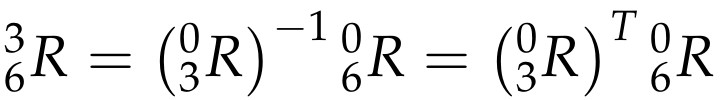

In [6]:
Image(filename="imgs/r3_6.png", width=768)

**Theta4**, **theta5** and **theta6** are extracted from the R3_6 matrix. We need to visualise the R3_6 matrix to determine the thetas, therefore:

In [7]:
# Create symbols
q1, q2, q3, q4, q5, q6, q7 = symbols('q1:8') # thetha_i
d1, d2, d3, d4, d5, d6, d7 = symbols('d1:8') # link offsets
a0, a1, a2, a3, a4, a5, a6 = symbols('a0:7') # link lengths
alpha0, alpha1, alpha2, alpha3, alpha4, alpha5, alpha6 = symbols('alpha0:7') # twist angle

# Define Modified DH Transformation matrix
DH = {  alpha0: 0,      a0: 0,      d1: 0.75,   q1: q1,
        alpha1: -pi/2., a1: 0.35,   d2: 0,      q2: q2 - pi/2.,
        alpha2: 0,      a2: 1.25,   d3: 0,      q3: q3,
        alpha3: -pi/2., a3: -0.054, d4: 1.50,   q4: q4,
        alpha4: pi/2.,  a4: 0,      d5: 0,      q5: q5,
        alpha5: -pi/2., a5: 0,      d6: 0,      q6: q6,
        alpha6: 0,      a6: 0,      d7: 0.303,  q7: q7}

T3_4 = T_Matrix(alpha3, a3, d4, q4).subs(DH)
T4_5 = T_Matrix(alpha4, a4, d5, q5).subs(DH)
T5_6 = T_Matrix(alpha5, a5, d6, q6).subs(DH)
T3_6 = T3_4 * T4_5 * T5_6
print('T3_6[0,0] =' + str(T3_6[0,0]))
print('T3_6[0,1] =' + str(T3_6[0,1]))
print('T3_6[0,2] =' + str(T3_6[0,2]))
print('T3_6[1,0] =' + str(T3_6[1,0]))
print('T3_6[1,1] =' + str(T3_6[1,1]))
print('T3_6[1,2] =' + str(T3_6[1,2]))
print('T3_6[2,0] =' + str(T3_6[2,0]))
print('T3_6[2,1] =' + str(T3_6[2,1]))
print('T3_6[2,2] =' + str(T3_6[2,2]))

T3_6[0,0] =-sin(q4)*sin(q6) + cos(q4)*cos(q5)*cos(q6)
T3_6[0,1] =-sin(q4)*cos(q6) - sin(q6)*cos(q4)*cos(q5)
T3_6[0,2] =-sin(q5)*cos(q4)
T3_6[1,0] =sin(q5)*cos(q6)
T3_6[1,1] =-sin(q5)*sin(q6)
T3_6[1,2] =cos(q5)
T3_6[2,0] =-sin(q4)*cos(q5)*cos(q6) - sin(q6)*cos(q4)
T3_6[2,1] =sin(q4)*sin(q6)*cos(q5) - cos(q4)*cos(q6)
T3_6[2,2] =sin(q4)*sin(q5)


Using a few trig identities, the following is observed (note that q = $\theta$):
* $\theta_4 = atan2(R^3_6(2,2), -R^3_6(0,2))$
* $\theta_5 = atan2(\sqrt{R^3_6(0,2)^2 + R^3_6(2,2)^2}, R^3_6(1,2))$
* $\theta_6 = atan2(-R^3_6(1,1), R^3_6(1,0))$

Due to the pow and sqrt function in theta5, there are **two solutions, so take the sign of theta5 into account**, which affects theta4 and theta6, so implement the following:

* if $\theta_5 > 0$ then  $\theta_4 = atan2(R^3_6(2,2), -R^3_6(0,2))$ and $\theta_6 = atan2(-R^3_6(1,1), R^3_6(1,0))$
* else $\theta_5 > 0$ then  $\theta_4 = atan2(-R^3_6(2,2), R^3_6(0,2))$ and $\theta_6 = atan2(R^3_6(1,1), -R^3_6(1,0))$

### 5.4 Debug implementation

In [8]:
def test_code(test_case):
    ## Set up code
    x = 0
    class Position:
        def __init__(self,EE_pos):
            self.x = EE_pos[0]
            self.y = EE_pos[1]
            self.z = EE_pos[2]
    class Orientation:
        def __init__(self,EE_ori):
            self.x = EE_ori[0]
            self.y = EE_ori[1]
            self.z = EE_ori[2]
            self.w = EE_ori[3]

    position = Position(test_case[0][0])
    orientation = Orientation(test_case[0][1])

    class Combine:
        def __init__(self,position,orientation):
            self.position = position
            self.orientation = orientation

    comb = Combine(position,orientation)

    class Pose:
        def __init__(self,comb):
            self.poses = [comb]

    req = Pose(comb)
    start_time = time()
    
    ########################################################################################
    
    # Create symbols
    q1, q2, q3, q4, q5, q6, q7 = symbols('q1:8') # thetha_i
    d1, d2, d3, d4, d5, d6, d7 = symbols('d1:8') # link offsets
    a0, a1, a2, a3, a4, a5, a6 = symbols('a0:7') # link lengths
    alpha0, alpha1, alpha2, alpha3, alpha4, alpha5, alpha6 = symbols('alpha0:7') # twist angle

    # Define Modified DH Transformation matrix
    DH = {  alpha0: 0,      a0: 0,      d1: 0.75,   q1: q1,
            alpha1: -pi/2., a1: 0.35,   d2: 0,      q2: q2 - pi/2.,
            alpha2: 0,      a2: 1.25,   d3: 0,      q3: q3,
            alpha3: -pi/2., a3: -0.054, d4: 1.50,   q4: q4,
            alpha4: pi/2.,  a4: 0,      d5: 0,      q5: q5,
            alpha5: -pi/2., a5: 0,      d6: 0,      q6: q6,
            alpha6: 0,      a6: 0,      d7: 0.303,  q7: q7}

    # Create individual transformation matrices
    T0_1 = T_Matrix(alpha0, a0, d1, q1).subs(DH)
    T1_2 = T_Matrix(alpha1, a1, d2, q2).subs(DH)
    T2_3 = T_Matrix(alpha2, a2, d3, q3).subs(DH)
    T3_4 = T_Matrix(alpha3, a3, d4, q4).subs(DH)
    T4_5 = T_Matrix(alpha4, a4, d5, q5).subs(DH)
    T5_6 = T_Matrix(alpha5, a5, d6, q6).subs(DH)
    T6_G = T_Matrix(alpha6, a6, d7, q7).subs(DH)

    px = req.poses[x].position.x
    py = req.poses[x].position.y
    pz = req.poses[x].position.z

    (roll, pitch, yaw) = tf.transformations.euler_from_quaternion(
                [req.poses[x].orientation.x, req.poses[x].orientation.y,
                    req.poses[x].orientation.z, req.poses[x].orientation.w])

    # Compensate for rotation discrepancy between DH parameters and URDF
    R_corr = Rot_z3(pi) * Rot_y3(-pi/2.)
    ROT_EE = Rot_z3(yaw) * Rot_y3(pitch) * Rot_x3(roll) * R_corr

    ## IK code begins
    EE = Matrix([[px], [py], [pz]])

    # EE length = d7 = 0.303
    WC = EE - (0.303) * ROT_EE[:,2]
            
    # Calculate joint angles using Geometric IK method, based on previous diagrams
    theta1 = atan2(WC[1], WC[0])

    # using triangle and cosine laws
    s_a = 1.501
    s_b = sqrt(pow((sqrt(WC[0]**2 + WC[1]**2) -0.35),2) + pow((WC[2] - 0.75), 2))
    s_c = 1.25

    ang_a = acos((s_b**2 + s_c**2 - s_a**2) / (2 * s_b * s_c))
    ang_b = acos((s_a**2 + s_c**2 - s_b**2) / (2 * s_a * s_c))
    ang_c = acos((s_a**2 + s_b**2 - s_c**2) / (2 * s_a * s_b))

    theta2 = pi/2. - ang_a - atan2(WC[2] - 0.75, sqrt(WC[0]**2 + WC[1]**2) - 0.35)
    theta3 = pi/2. - ang_b - 0.036

    R0_3 = T0_1[0:3,0:3] * T1_2[0:3,0:3] * T2_3[0:3,0:3]

    R0_3 = R0_3.evalf(subs={q1: theta1, q2:theta2, q3:theta3})
    R3_6 = Transpose(R0_3) * ROT_EE

    theta5 = atan2(sqrt(R3_6[0,2]**2 + R3_6[2,2]**2), R3_6[1,2])

    if theta5 > 0:
        theta4 = atan2(R3_6[2,2], -R3_6[0,2])
        theta6 = atan2(-R3_6[1,1], R3_6[1,0])
    else:
        theta4 = atan2(-R3_6[2,2], R3_6[0,2])
        theta6 = atan2(R3_6[1,1], -R3_6[1,0])
    
    ########################################################################################
    ## For additional debugging add your forward kinematics here. Use your previously calculated thetas
    ## as the input and output the position of your end effector as your_ee = [x,y,z]
    
    # Composition of homogenous transforms
    T0_G = T0_1 * T1_2 * T2_3 * T3_4 * T4_5 * T5_6 * T6_G    

    # Then account for difference in orientation between Gripper and DH convention
    # by rotating about z-axis by pi and about y-axis by -pi/2
    R_corr = Rot_z4(pi) * Rot_y4(-pi/2.)
    T_EE = T0_G * R_corr

    EE_m = T_EE.evalf(subs={q1:theta1, q2:theta2, q3:theta3, q4:theta4, q5:theta5, q6:theta6}) 

    ## For error analysis please set the following variables of your WC location and EE location in the format of [x,y,z]
    your_wc = [WC[0],WC[1],WC[2]] # <--- Load your calculated WC values in this array
    your_ee = [EE_m[0,3],EE_m[1,3],EE_m[2,3]] # Load your calculated end effector value from your forward kinematics

    ########################################################################################

    ## Error analysis
    print ("\nTotal run time to calculate joint angles from pose is %04.4f seconds" % (time()-start_time))

    # Find WC error
    if not(sum(your_wc)==3):
        wc_x_e = abs(your_wc[0]-test_case[1][0])
        wc_y_e = abs(your_wc[1]-test_case[1][1])
        wc_z_e = abs(your_wc[2]-test_case[1][2])
        wc_offset = sqrt(wc_x_e**2 + wc_y_e**2 + wc_z_e**2)
        print ("\nWrist error for x position is: %04.8f" % wc_x_e)
        print ("Wrist error for y position is: %04.8f" % wc_y_e)
        print ("Wrist error for z position is: %04.8f" % wc_z_e)
        print ("Overall wrist offset is: %04.8f units" % wc_offset)

    # Find theta errors
    t_1_e = abs(theta1-test_case[2][0])
    t_2_e = abs(theta2-test_case[2][1])
    t_3_e = abs(theta3-test_case[2][2])
    t_4_e = abs(theta4-test_case[2][3])
    t_5_e = abs(theta5-test_case[2][4])
    t_6_e = abs(theta6-test_case[2][5])
    print ("\nTheta 1 error is: %04.8f" % t_1_e)
    print ("Theta 2 error is: %04.8f" % t_2_e)
    print ("Theta 3 error is: %04.8f" % t_3_e)
    print ("Theta 4 error is: %04.8f" % t_4_e)
    print ("Theta 5 error is: %04.8f" % t_5_e)
    print ("Theta 6 error is: %04.8f" % t_6_e)

    # Find FK EE error
    if not(sum(your_ee)==3):
        ee_x_e = abs(your_ee[0]-test_case[0][0][0])
        ee_y_e = abs(your_ee[1]-test_case[0][0][1])
        ee_z_e = abs(your_ee[2]-test_case[0][0][2])
        ee_offset = sqrt(ee_x_e**2 + ee_y_e**2 + ee_z_e**2)
        print ("\nEnd effector error for x position is: %04.8f" % ee_x_e)
        print ("End effector error for y position is: %04.8f" % ee_y_e)
        print ("End effector error for z position is: %04.8f" % ee_z_e)
        print ("Overall end effector offset is: %04.8f units \n" % ee_offset)

### 5.5 Test cases
Run some tests on the three test cases and comment on the EE position.

In [9]:
test_case_number = 1
test_code(test_cases[test_case_number])


Total run time to calculate joint angles from pose is 0.9266 seconds

Wrist error for x position is: 0.00000046
Wrist error for y position is: 0.00000032
Wrist error for z position is: 0.00000545
Overall wrist offset is: 0.00000548 units

Theta 1 error is: 0.00093770
Theta 2 error is: 0.00181024
Theta 3 error is: 0.00205031
Theta 4 error is: 0.00172067
Theta 5 error is: 0.00197873
Theta 6 error is: 0.00251871

End effector error for x position is: 0.00002010
End effector error for y position is: 0.00001531
End effector error for z position is: 0.00002660
Overall end effector offset is: 0.00003668 units 



In [10]:
test_case_number = 2
test_code(test_cases[test_case_number])


Total run time to calculate joint angles from pose is 0.7819 seconds

Wrist error for x position is: 0.00002426
Wrist error for y position is: 0.00000562
Wrist error for z position is: 0.00006521
Overall wrist offset is: 0.00006980 units

Theta 1 error is: 3.14309971
Theta 2 error is: 0.27930449
Theta 3 error is: 1.86835102
Theta 4 error is: 3.08639294
Theta 5 error is: 0.06340564
Theta 6 error is: 6.13524247

End effector error for x position is: 0.00002566
End effector error for y position is: 0.00002581
End effector error for z position is: 0.00000461
Overall end effector offset is: 0.00003668 units 



In [11]:
test_case_number = 3
test_code(test_cases[test_case_number])


Total run time to calculate joint angles from pose is 0.7864 seconds

Wrist error for x position is: 0.00000503
Wrist error for y position is: 0.00000512
Wrist error for z position is: 0.00000585
Overall wrist offset is: 0.00000926 units

Theta 1 error is: 0.00136747
Theta 2 error is: 0.00325738
Theta 3 error is: 0.00339563
Theta 4 error is: 6.28212730
Theta 5 error is: 0.00284405
Theta 6 error is: 6.28223850

End effector error for x position is: 0.00000069
End effector error for y position is: 0.00000011
End effector error for z position is: 0.00003668
Overall end effector offset is: 0.00003668 units 



When run without the overheads of jupyter, it is slightly faster, as shown below:

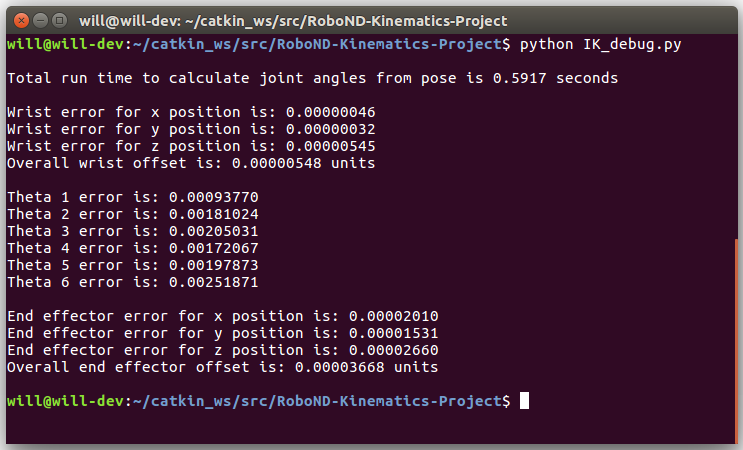

In [12]:
Image(filename="imgs/testcase_1.png", width=768, height=480)

The results demonstrate that the EE position error is very low. In test cases 2 and 3, there are errors in the theta values, as the joint angle solution is not unique, so multiple different joint angles can yield the same EE position.

## 6. Project implementation
The IK_debug code was transferred to the IK_server.py code. The demo mode flag in inverse_kinematics.launch was set to false. The project was launched by sourcing the workspace and running:
* `cd ~/catkin_ws/src/RoboND-Kinematics-Project/kuka_arm/scripts`
* `./safe_spawner.sh`
In a new terminal, after workspace sourcing the IK_server.py was launched by:
* `rosrun kuka_arm IK_server.py`
The first image is displaying the calculated path and the second image is the completed Pick and Place operation.

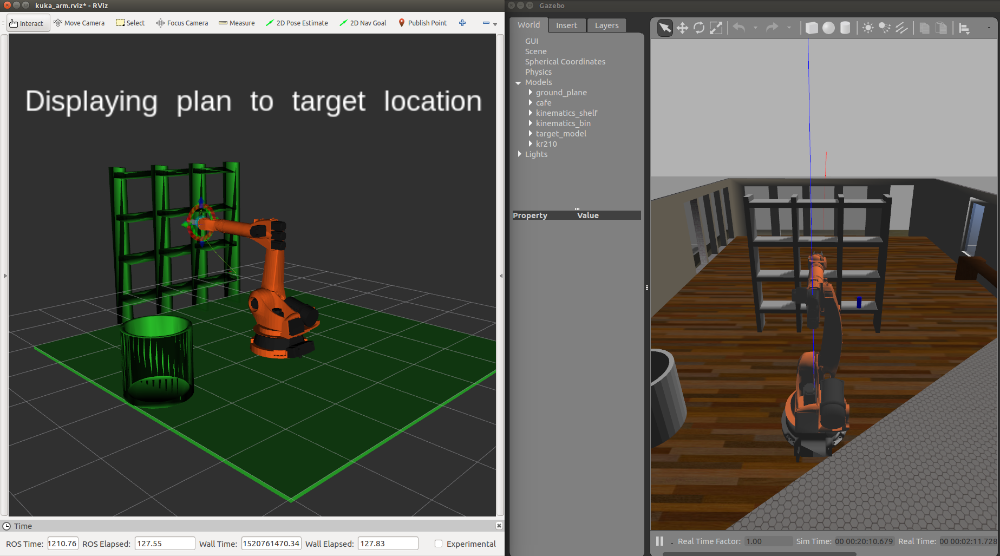

In [13]:
Image(filename="imgs/display_path.png", width=1024, height=768)

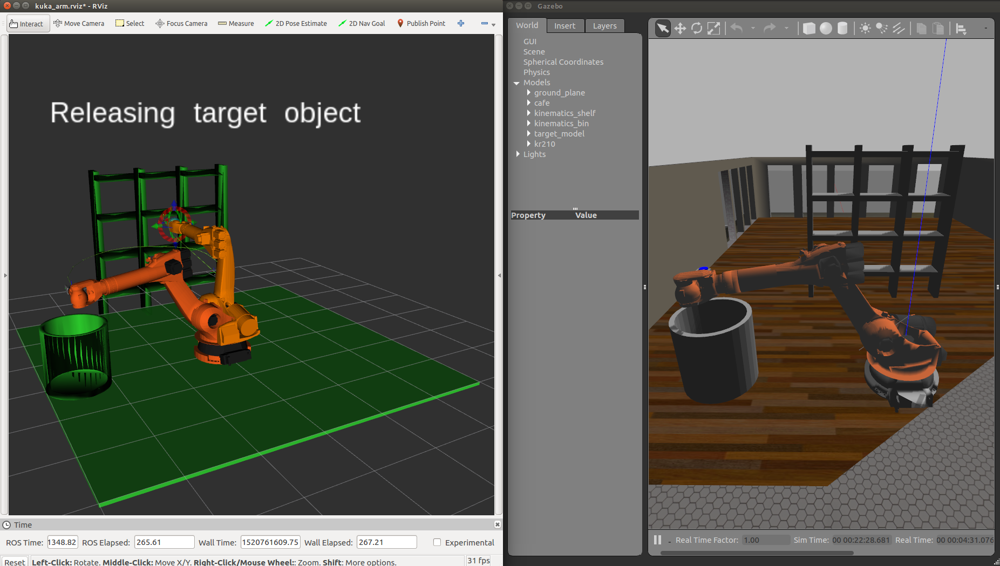

In [14]:
Image(filename="imgs/complete.png", width=1024, height=768)

## 7. Conclusion
The implementation was successfully able to pick up the object from the shelf, and release the object into the bin, meeting the minimum requires of 8/10 successful runs. As an observation, some motions resulted in the joints rotating unnecessarily - for example the end effector rotating by 180 degrees along joint 6. For future work, I would like to minimise the rotations, and give the arm the intelligence to select the best joint angle, based on the previously stored angle.